In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
DIR = '/content/drive/MyDrive/AI ML Material/OpenCV_Tutorial'
os.chdir(DIR)
os.getcwd()

'/content/drive/MyDrive/AI ML Material/OpenCV_Tutorial'

In [4]:
!ls

images	OpenCV.ipynb


In [5]:
import cv2
from google.colab.patches import cv2_imshow

## Basic Operations of OpenCV at a Glance

### Reading an image

In [21]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
# Importing the OpenCV library
import cv2
# Reading the image using imread() function
image = cv2.imread('opencv_image1.jpeg')
cv2_imshow(image)

# Extracting the height and width of an image
h, w = image.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))

Output hidden; open in https://colab.research.google.com to view.

### Extracting the RGB values of a pixel

In [ ]:
# Extracting RGB values.
# Here we have randomly chosen a pixel
# by passing in 100, 100 for height and width.
(B, G, R) = image[100, 100]

# Displaying the pixel values
print("R = {}, G = {}, B = {}".format(R, G, B))

# We can also pass the channel to extract
# the value for a specific channel
B = image[100, 100, 0]
print("B = {}".format(B))

R = 211, G = 172, B = 165
B = 165


### Extracting the Region of Interest (ROI)

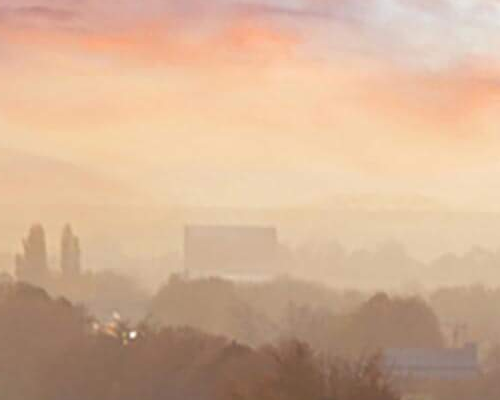

In [ ]:
# We will calculate the region of interest
# by slicing the pixels of the image
roi = image[100 : 500, 200 : 700]
cv2_imshow(roi)

### Resizing the Image

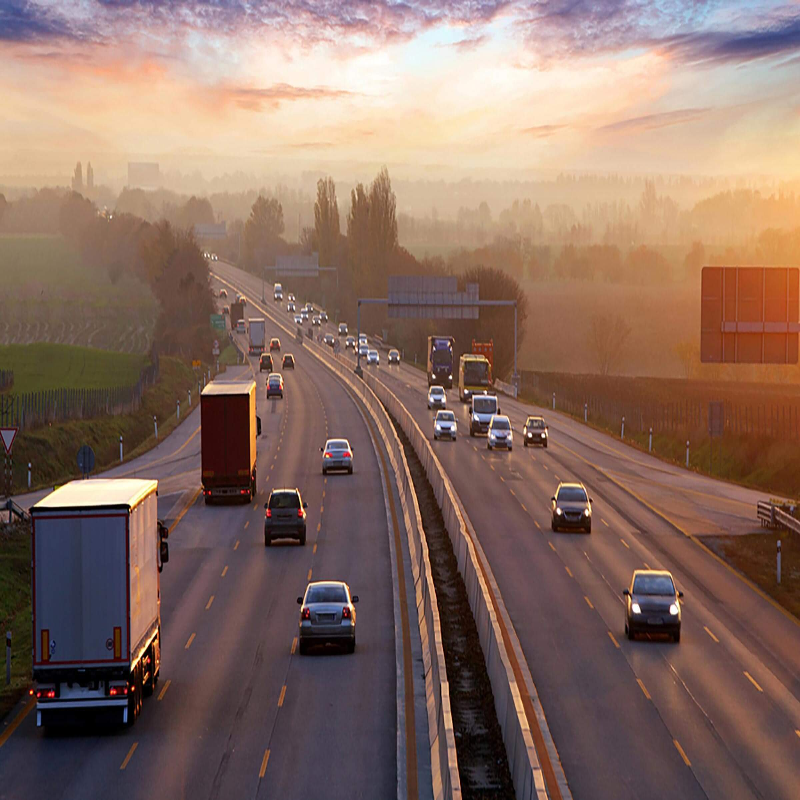

Height = 800, Width = 800


In [ ]:
# resize() function takes 2 parameters,
# the image and the dimensions
resize = cv2.resize(image, (800, 800))
cv2_imshow(resize)
h, w = resize.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))

The problem with this approach is that the aspect ratio of the image is not maintained. So we need to do some extra work in order to maintain a proper aspect ratio.

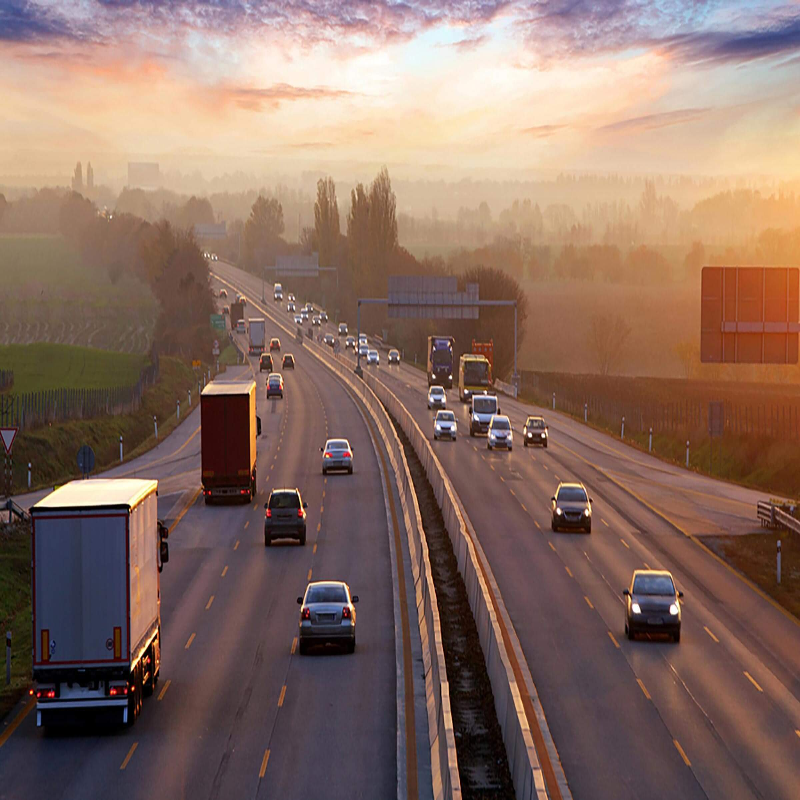

In [ ]:
# Calculating the ratio
ratio = 800 / w

# Creating a tuple containing width and height
dim = (800, int(h * ratio))

# Resizing the image
resize_aspect = cv2.resize(image, dim)
cv2_imshow(resize_aspect)

### Rotating the Image

In [ ]:
# Calculating the center of the image
center = (w // 2, h // 2)

# Generating a rotation matrix
matrix = cv2.getRotationMatrix2D(center, -45, 1.0)

# Performing the affine transformation
rotated = cv2.warpAffine(image, matrix, (w, h))
cv2_imshow(rotated)

Output hidden; open in https://colab.research.google.com to view.

There are a lot of steps involved in rotating an image. So, let me explain each of them in detail.
The 2 main functions used here are –
  - getRotationMatrix2D()
  - warpAffine()



  getRotationMatrix2D() :-

  It takes 3 arguments –
  - Center – The center coordinates of the image
  - Angle – The angle (in degrees) by which the image should be rotated
  - Scale – The scaling factor


  It returns a 2*3 matrix consisting of values derived from alpha and beta
  - alpha = scale * cos(angle)
  - beta = scale * sine(angle)


  warpAffine() :-

   The function warpAffine transforms the source image using the rotation matrix:

   `dst(x, y) = src(M11X + M12Y + M13, M21X + M22Y + M23)`
   
   Here M is the rotation matrix, described above.
It calculates new x, y co-ordinates of the image and transforms it.

### Drawing a Rectangle
It is an in-place operation.

It takes in 5 arguments –

  - Image
  - Top-left corner co-ordinates
  - Bottom-right corner co-ordinates
  - Color (in BGR format)
  - Line width

In [ ]:
# We are copying the original image,
# as it is an in-place operation.
output = image.copy()

# Using the rectangle() function to create a rectangle.
rectangle = cv2.rectangle(output, (1500, 900),
						(600, 400), (255, 0, 0), 2)
cv2_imshow(rectangle)

Output hidden; open in https://colab.research.google.com to view.

### Displaying text
It is also an in-place operation

It takes in 7 arguments –

  1. Image
  2. Text to be displayed
  3. Bottom-left corner co-ordinates, from where the text should start
  4. Font
  5. Font size
  6. Color (BGR format)
  7. Line width

In [ ]:
# Copying the original image
output = image.copy()

# Adding the text using putText() function
text = cv2.putText(output, 'OpenCV Demo', (500, 550),
				cv2.FONT_HERSHEY_SIMPLEX, 4, (255, 0, 0), 2)
cv2_imshow(text)

Output hidden; open in https://colab.research.google.com to view.

## Reading an image

 To read the images cv2.imread() method is used. This method loads an image from the specified file. If the image cannot be read (because of missing file, improper permissions, unsupported or invalid format) then this method returns an empty matrix.

Syntax: cv2.imread(path, flag)

Parameters:

path: A string representing the path of the image to be read.

flag: It specifies the way in which image should be read. It’s default value is cv2.IMREAD_COLOR

  - cv2.IMREAD_COLOR: It specifies to load a color image. Any transparency of image will be neglected. It is the default flag. Alternatively, we can pass integer value 1 for this flag.
  - cv2.IMREAD_GRAYSCALE: It specifies to load an image in grayscale mode. Alternatively, we can pass integer value 0 for this flag.
  - cv2.IMREAD_UNCHANGED: It specifies to load an image as such including alpha channel. Alternatively, we can pass integer value -1 for this flag.

Return Value: This method returns an image that is loaded from the specified file.

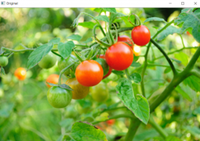

In [ ]:
# Python code to read image
import cv2

# To read image from disk, we use
# cv2.imread function, in below method,
img = cv2.imread("image2.png", cv2.IMREAD_COLOR)

# Creating GUI window to display an image on screen
# first Parameter is windows title (should be in string format)
# Second Parameter is image array
# cv2.imshow("image", img)
cv2_imshow(img)

# To hold the window on screen, we use cv2.waitKey method
# Once it detected the close input, it will release the control
# To the next line
# First Parameter is for holding screen for specified milliseconds
# It should be positive integer. If 0 pass an parameter, then it will
# hold the screen until user close it.
# cv2.waitKey(0)

# It is for removing/deleting created GUI window from screen
# and memory
# cv2.destroyAllWindows()


We can see the shape , i.e., width and height and channels of the image using shape attribute.

In [ ]:
img.shape

(141, 200, 3)

Matplotlib library uses RGB color format to read a colored image. Here we are demonstrating an example of reading an image using this library.


`Note:` See the difference in colors of images read by cv2 and matplotlib library. Because cv2 uses BGR color format and matplotlib uses RGB color format. To convert BGR to RGB, we us a function:



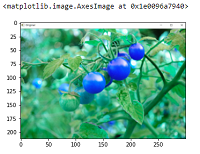

In [ ]:
#import cv2, numpy and matplotlib libraries
import numpy as np
import matplotlib.pyplot as plt
img3=cv2.imread("image3.png")
# img.shape
#Displaying image using plt.imshow() method
cv2_imshow(img3)

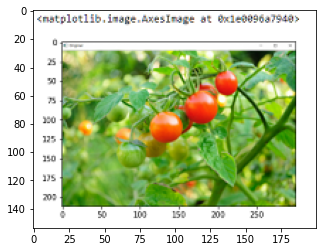

In [ ]:
#import cv2, numpy and matplotlib libraries
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimage
# img3=mpimage.imread("image3.png")
img3=cv2.imread("image3.png")
# img.shape
#Displaying image using plt.imshow() method
plt.imshow(img3)

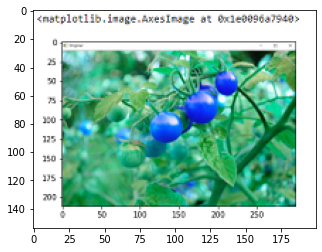

In [ ]:
#import cv2, numpy and matplotlib libraries
import numpy as np
import matplotlib.pyplot as plt
img4=cv2.imread("image3.png")

# Converting BGR color to RGB color format
RGB_img = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

#Displaying image using plt.imshow() method
plt.imshow(RGB_img)


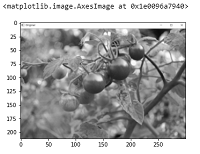

In [ ]:
#import cv2, numpy and matplotlib libraries
import numpy as np
import matplotlib.pyplot as plt
img4=cv2.imread("image3.png",cv2.IMREAD_GRAYSCALE)

# Converting BGR color to RGB color format
# RGB_img = cv2.cvtColor(img4, cv2.IMREAD_GRAYSCALE)

#Displaying image using plt.imshow() method
cv2_imshow(img4)

## Arithmetic Operations on Images using OpenCV | Set-1 (Addition and Subtraction)

### Addition of Image:

We can add two images by using function cv2.add(). This directly adds up image pixels in the two images.

Syntax: cv2.add(img1, img2)

But adding the pixels is not an ideal situation. So, we use cv2.addweighted(). Remember, both images should be of equal size and depth. 


Syntax: cv2.addWeighted(img1, wt1, img2, wt2, gammaValue)

Parameters: 
  - img1: First Input Image array(Single-channel, 8-bit or floating-point) 
  - wt1: Weight of the first input image elements to be applied to the final image 
  - img2: Second Input Image array(Single-channel, 8-bit or floating-point) 
  - wt2: Weight of the second input image elements to be applied to the final image 
  - gammaValue: Measurement of light

shape of image1: (250, 500, 3)
shape of image2: (250, 500, 3)


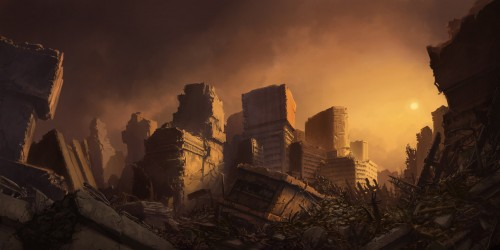

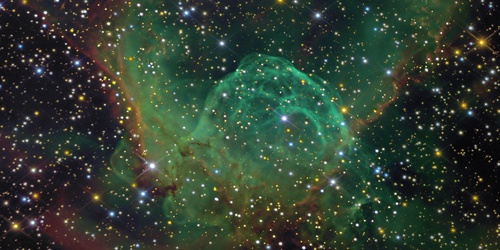

In [ ]:

# Python program to illustrate
# arithmetic operation of
# addition of two images
   
# organizing imports
import cv2
import numpy as np
   
# path to input images are specified and 
# images are loaded with imread command
image1 = cv2.imread('add_image1.jpeg')
image2 = cv2.imread('add_image2.jpeg')

print(f"shape of image1: {image1.shape}")
print(f"shape of image2: {image2.shape}")
cv2_imshow(image1)
cv2_imshow(image2)

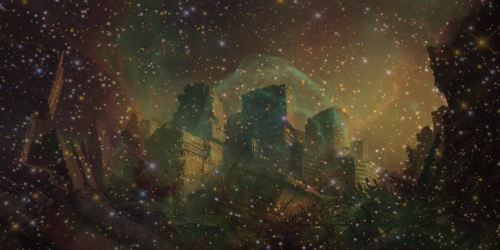

In [ ]:
# cv2.addWeighted is applied over the
# image inputs with applied parameters
weightedSum = cv2.addWeighted(image1, 0.5, image2, 0.4, 0)

# the window showing output image
# with the weighted sum
cv2_imshow(weightedSum)

## Subtraction of Image:

Just like addition, we can subtract the pixel values in two images and merge them with the help of cv2.subtract(). The images should be of equal size and depth. 

Syntax:  cv2.subtract(src1, src2)


shape of image1: (168, 300, 3)
shape of image2: (168, 300, 3)


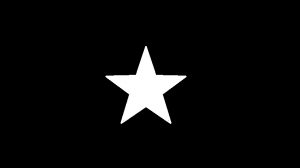

++++++++++++++++++++


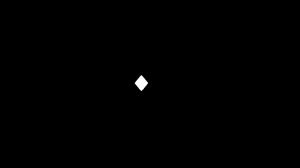

In [ ]:
# Python program to illustrate
# arithmetic operation of
# subtraction of pixels of two images
 
# organizing imports
import cv2
import numpy as np
   
# path to input images are specified and 
# images are loaded with imread command
image1 = cv2.imread('substract_img1.jpeg')
image2 = cv2.imread('substract_imag2.jpeg')

print(f"shape of image1: {image1.shape}")
print(f"shape of image2: {image2.shape}")
cv2_imshow(image1)
print("++++++++++++++++++++")
cv2_imshow(image2)

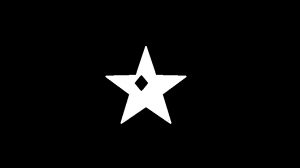

In [ ]:
# cv2.subtract is applied over the
# image inputs with applied parameters
sub = cv2.subtract(image1, image2)
 
# the window showing output image
# with the subtracted image
cv2_imshow(sub)

## Arithmetic Operations on Images using OpenCV | Set-2 (Bitwise Operations on Binary Images)

Bitwise operations are used in image manipulation and used for extracting essential parts in the image. Some of the operations are :-

  1. AND
  2. OR
  3. XOR
  4. NOT

Also, Bitwise operations helps in image masking. Image creation can be enabled with the help of these operations. These operations can be helpful in enhancing the properties of the input images. 

NOTE: The Bitwise operations should be applied on input images of same dimensions


### Bitwise AND operation on Image:

Syntax: cv2.bitwise_and(source1, source2, destination, mask)

Parameters: 
  - source1: First Input Image array(Single-channel, 8-bit or floating-point) 
  - source2: Second Input Image array(Single-channel, 8-bit or floating-point) 
  - dest: Output array (Similar to the dimensions and type of Input image array) 
  - mask: Operation mask, Input / output 8-bit single-channel mask 

shape of image1: (250, 499, 3)
shape of image2: (250, 499, 3)


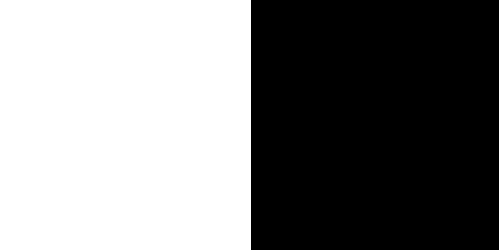

Image 1


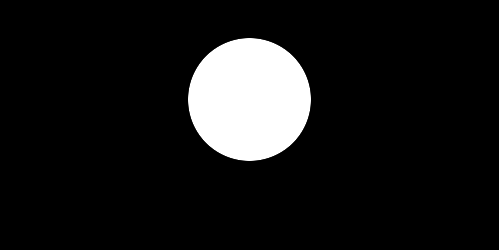

Image 2


In [28]:
import cv2
import numpy as np
    
# path to input images are specified and  
# images are loaded with imread command 
img1 = cv2.imread('bit_img1.png') 
img2 = cv2.imread('bit_img2.png')

print(f"shape of image1: {img1.shape}")
print(f"shape of image2: {img2.shape}")
cv2_imshow(img1)
print("Image 1")
cv2_imshow(img2)
print("Image 2")

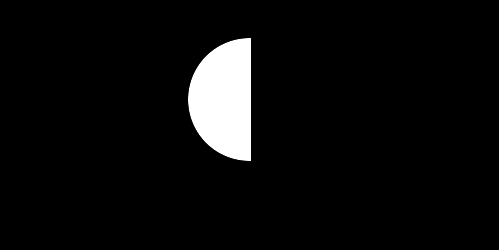

In [29]:
# cv2.bitwise_and is applied over the
# image inputs with applied parameters
dest_and = cv2.bitwise_and(img2, img1, mask = None)
 
# the window showing output image
# with the Bitwise AND operation
# on the input images
cv2_imshow(dest_and)

### Bitwise OR operation on Image:
Bit-wise disjunction of input array elements.

Syntax: cv2.bitwise_or(source1, source2, destination, mask)

Parameters: 
  - source1: First Input Image array(Single-channel, 8-bit or floating-point) 
  - source2: Second Input Image array(Single-channel, 8-bit or floating-point) 
  - dest: Output array (Similar to the dimensions and type of Input image array) 
  - mask: Operation mask, Input / output 8-bit single-channel mask 

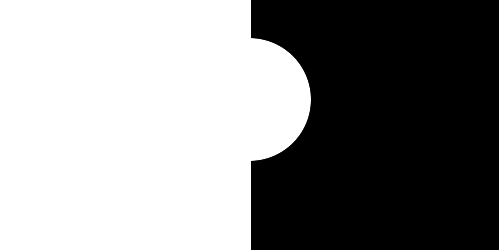

In [30]:
# cv2.bitwise_or is applied over the
# image inputs with applied parameters
dest_or = cv2.bitwise_or(img2, img1, mask = None)
 
# the window showing output image
# with the Bitwise OR operation
# on the input images
cv2_imshow(dest_or)

### Bitwise XOR operation on Image:
Bit-wise exclusive-OR operation on input array elements. 


Syntax: cv2.bitwise_xor(source1, source2, destination, mask)
Parameters: 
  - source1: First Input Image array(Single-channel, 8-bit or floating-point) 
  - source2: Second Input Image array(Single-channel, 8-bit or floating-point) 
  - dest: Output array (Similar to the dimensions and type of Input image array) 
  - mask: Operation mask, Input / output 8-bit single-channel mask 

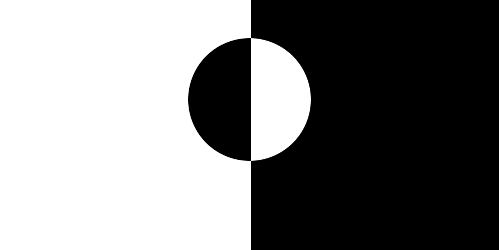

In [31]:
# cv2.bitwise_xor is applied over the
# image inputs with applied parameters
dest_xor = cv2.bitwise_xor(img1, img2, mask = None)
 
# the window showing output image
# with the Bitwise XOR operation
# on the input images
cv2_imshow(dest_xor)

### Bitwise NOT operation on Image:
Inversion of input array elements. 

Syntax: cv2.bitwise_not(source, destination, mask)

Parameters: 
  - source: Input Image array(Single-channel, 8-bit or floating-point) 
  - dest: Output array (Similar to the dimensions and type of Input image array) 
  - mask: Operation mask, Input / output 8-bit single-channel mask 

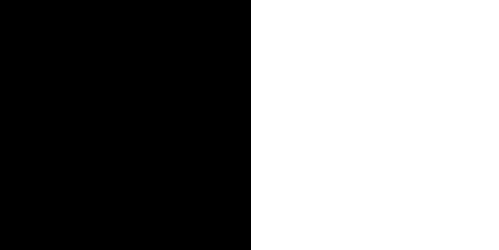

+++++++++++++++


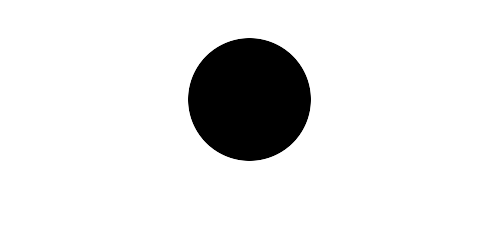

In [33]:
# cv2.bitwise_not is applied over the
# image input with applied parameters
dest_not1 = cv2.bitwise_not(img1, mask = None)
dest_not2 = cv2.bitwise_not(img2, mask = None)
 
# the windows showing output image
# with the Bitwise NOT operation
# on the 1st and 2nd input image
cv2_imshow(dest_not1)
print('+++++++++++++++')
cv2_imshow(dest_not2)

## Image Resizing using OpenCV

Image resizing refers to the scaling of images. Scaling comes in handy in many image processing as well as machine learning applications. It helps in reducing the number of pixels from an image and that has several advantages e.g. It can reduce the time of training of a neural network as more is the number of pixels in an image more is the number of input nodes that in turn increases the complexity of the model.
It also helps in zooming in images. Many times we need to resize the image i.e. either shrink it or scale up to meet the size requirements. OpenCV provides us several interpolation methods for resizing an image.
 

Choice of Interpolation Method for Resizing – 

  - cv2.INTER_AREA: This is used when we need to shrink an image.
  - cv2.INTER_CUBIC: This is slow but more efficient.
  - cv2.INTER_LINEAR: This is primarily used when zooming is required. This is the default interpolation technique in OpenCV.



Note: One thing to keep in mind while using the cv2.resize() function is that the tuple passed for determining the size of the new image ((1050, 1610) in this case) follows the order (width, height) unlike as expected (height, width).

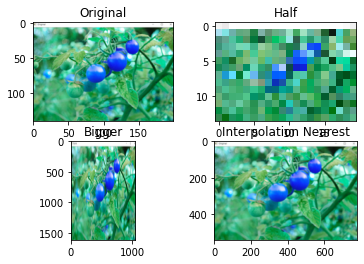

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread("./images/image2.png")
# Loading the image

half = cv2.resize(image, (0, 0), fx = 0.1, fy = 0.1)
bigger = cv2.resize(image, (1050, 1610))

stretch_near = cv2.resize(image, (780, 540),
			interpolation = cv2.INTER_NEAREST)


Titles =["Original", "Half", "Bigger", "Interpolation Nearest"]
images =[image, half, bigger, stretch_near]
count = 4

for i in range(count):
	plt.subplot(2, 2, i + 1)
	plt.title(Titles[i])
	plt.imshow(images[i])

plt.show()


## Image Processing in Python (Scaling, Rotating, Shifting and Edge Detection)

### Scaling an Image :-

Scaling operation increases/reduces size of an image.

In [44]:
import cv2
import numpy as np

FILE_NAME = './images/cat3.jpeg'
try:
	# Read image from disk.
	img = cv2.imread(FILE_NAME)

	# Get number of pixel horizontally and vertically.
	(height, width) = img.shape[:2]

	# Specify the size of image along with interploation methods.
	# cv2.INTER_AREA is used for shrinking, whereas cv2.INTER_CUBIC
	# is used for zooming.
	res = cv2.resize(img, (int(width / 2), int(height / 2)), interpolation = cv2.INTER_CUBIC)

	# Write image back to disk.
	cv2.imwrite('./images/cat3_rescale.jpeg', res)

except IOError:
	print ('Error while reading files !!!')

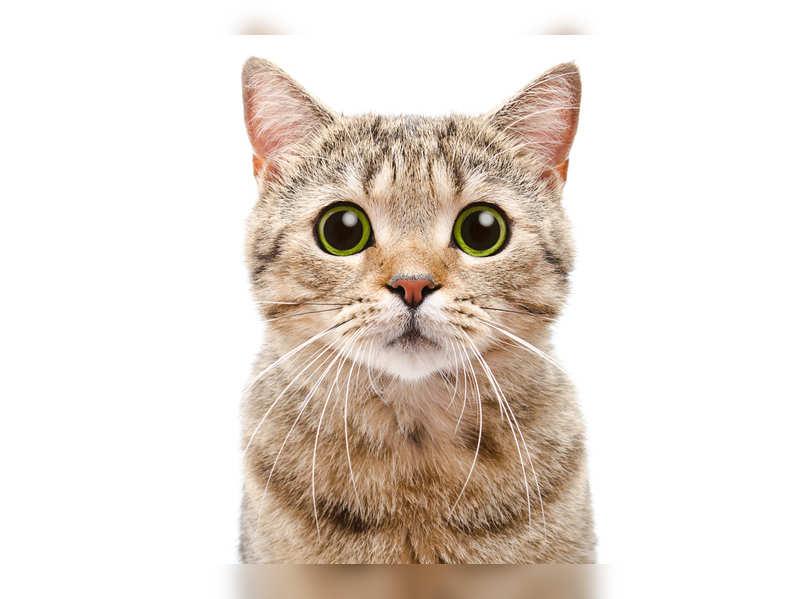

Height = 599, Width = 800


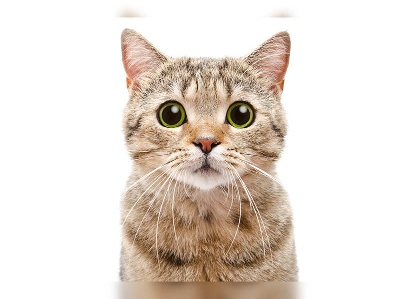

Height = 299, Width = 400


In [47]:
img = cv2.imread('./images/cat3.jpeg')
cv2_imshow(img)
# Extracting the height and width of an image
h, w = img.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))
img_scale = cv2.imread('./images/cat3_rescale.jpeg')
cv2_imshow(img_scale)
# Extracting the height and width of an image
h, w = img_scale.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))

### Rotating an image :-

Images can be rotated to any degree clockwise or otherwise. We just need to define rotation matrix listing rotation point, degree of rotation and the scaling factor.

In [49]:
import cv2
import numpy as np

FILE_NAME = './images/cat3.jpeg'
try:
	# Read image from the disk.
	img = cv2.imread(FILE_NAME)

	# Shape of image in terms of pixels.
	(rows, cols) = img.shape[:2]

	# getRotationMatrix2D creates a matrix needed for transformation.
	# We want matrix for rotation w.r.t center to 45 degree without scaling.
	M = cv2.getRotationMatrix2D((cols / 2, rows / 2), 45, 1)
	res = cv2.warpAffine(img, M, (cols, rows))

	# Write image back to disk.
	cv2.imwrite('./images/cat3_rotate.jpeg', res)
except IOError:
	print ('Error while reading files !!!')


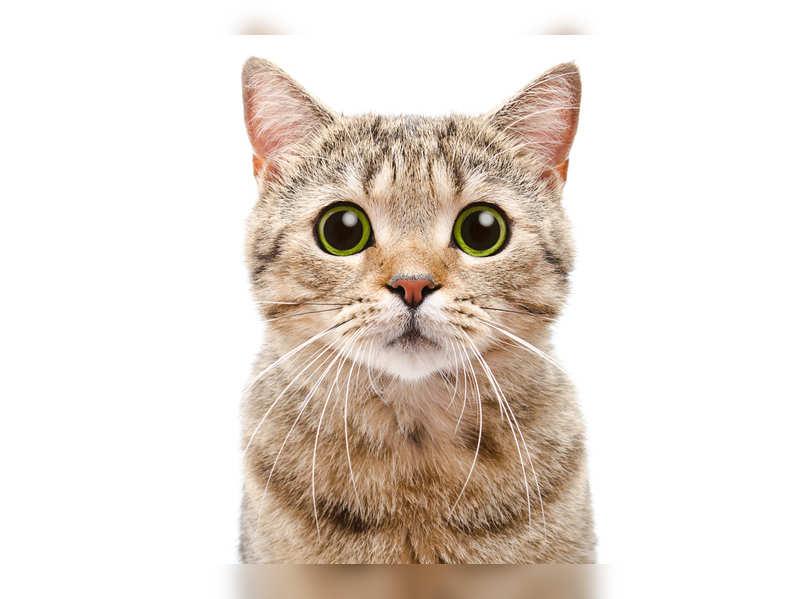

Height = 599, Width = 800


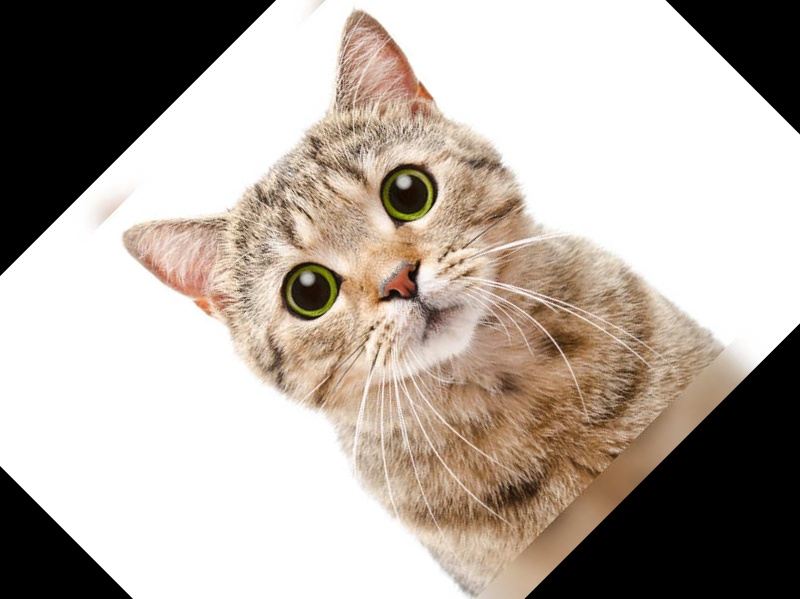

Height = 599, Width = 800


In [50]:
img = cv2.imread('./images/cat3.jpeg')
cv2_imshow(img)
# Extracting the height and width of an image
h, w = img.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))
img_scale = cv2.imread('./images/cat3_rotate.jpeg')
cv2_imshow(img_scale)
# Extracting the height and width of an image
h, w = img_scale.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))

### Translating an Image :-
Translating an image means shifting it within a given frame of reference.



In [51]:
import cv2
import numpy as np

FILE_NAME = './images/cat3.jpeg'
# Create translation matrix.
# If the shift is (x, y) then matrix would be
# M = [1 0 x]
#	 [0 1 y]
# Let's shift by (100, 50).
M = np.float32([[1, 0, 100], [0, 1, 50]])

try:

	# Read image from disk.
	img = cv2.imread(FILE_NAME)
	(rows, cols) = img.shape[:2]

	# warpAffine does appropriate shifting given the
	# translation matrix.
	res = cv2.warpAffine(img, M, (cols, rows))

	# Write image back to disk.
	cv2.imwrite('./images/cat3_translate.jpeg', res)

except IOError:
	print ('Error while reading files !!!')


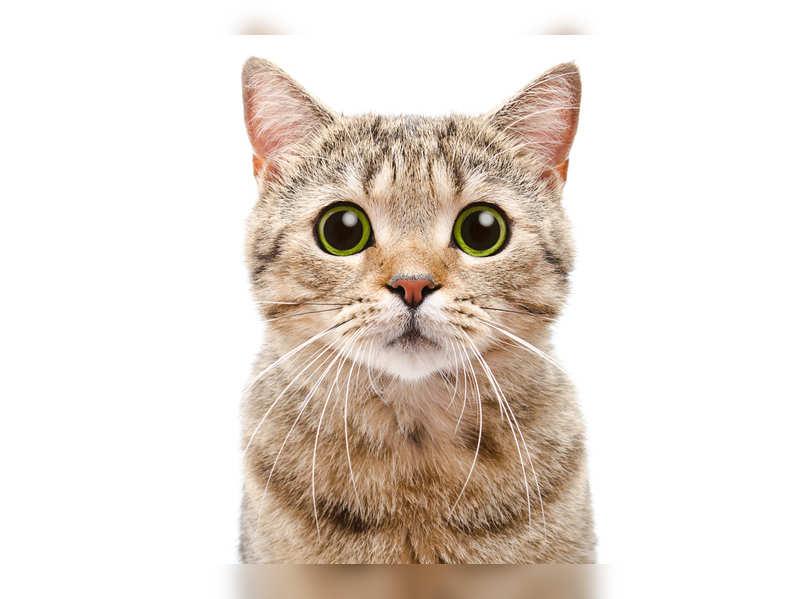

Height = 599, Width = 800


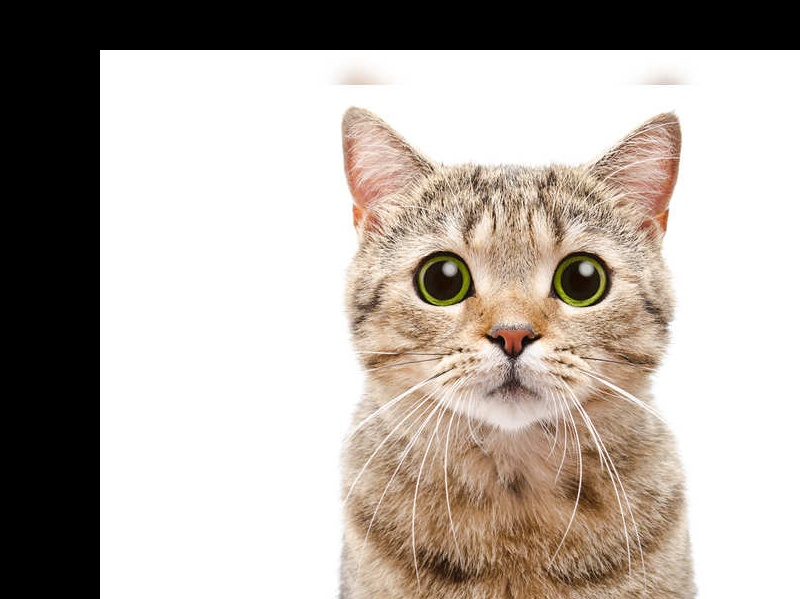

Height = 599, Width = 800


In [52]:
img = cv2.imread('./images/cat3.jpeg')
cv2_imshow(img)
# Extracting the height and width of an image
h, w = img.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))
img_scale = cv2.imread('./images/cat3_translate.jpeg')
cv2_imshow(img_scale)
# Extracting the height and width of an image
h, w = img_scale.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))

### Edge detection in an Image :-
The process of image detection involves detecting sharp edges in the image. This edge detection is essential in context of image recognition or object localization/detection. There are several algorithms for detecting edges due to it’s wide applicability. We’ll be using one such algorithm known as Canny Edge Detection.

In [53]:
import cv2
import numpy as np

FILE_NAME = './images/cat3.jpeg'
try:
	# Read image from disk.
	img = cv2.imread(FILE_NAME)

	# Canny edge detection.
	edges = cv2.Canny(img, 100, 200)

	# Write image back to disk.
	cv2.imwrite('./images/cat3_edge.jpeg', edges)
except IOError:
	print ('Error while reading files !!!')


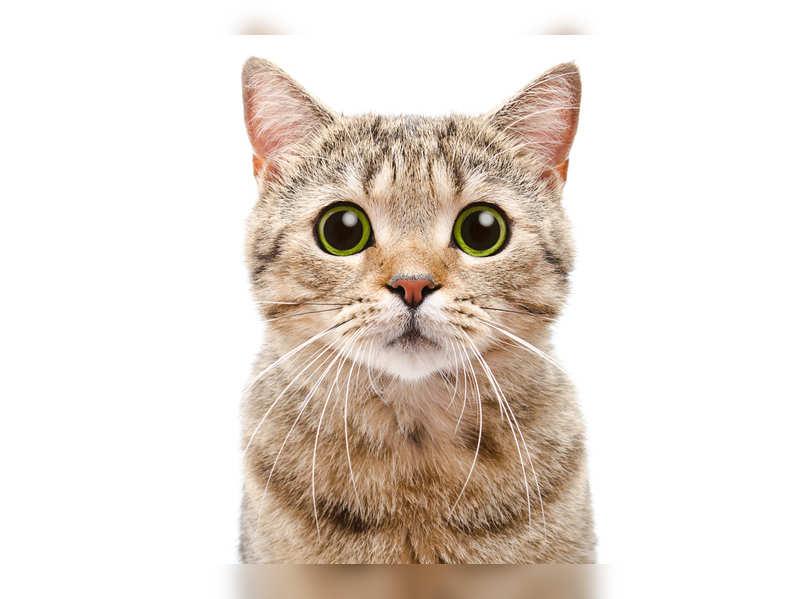

Height = 599, Width = 800


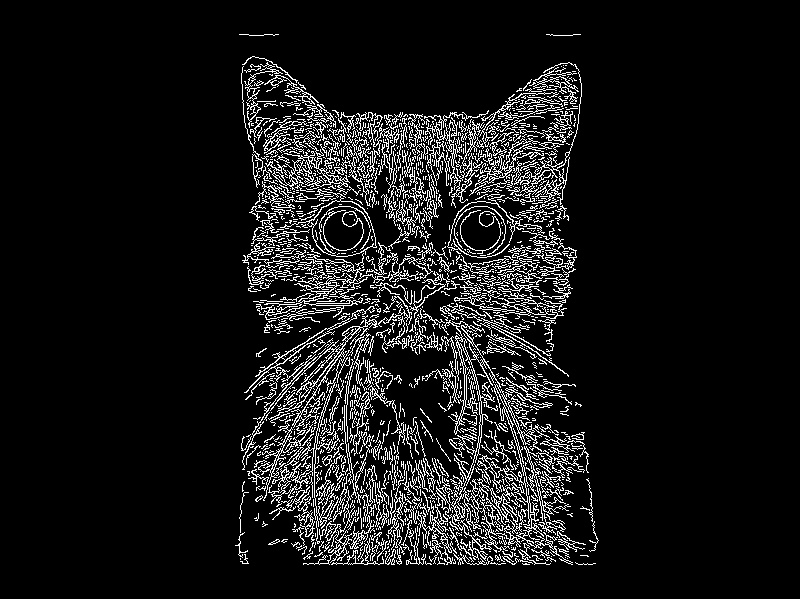

Height = 599, Width = 800


In [54]:
img = cv2.imread('./images/cat3.jpeg')
cv2_imshow(img)
# Extracting the height and width of an image
h, w = img.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))
img_scale = cv2.imread('./images/cat3_edge.jpeg')
cv2_imshow(img_scale)
# Extracting the height and width of an image
h, w = img_scale.shape[:2]
# Displaying the height and width
print("Height = {}, Width = {}".format(h, w))

## Image blurring using OpenCV

**Image Blurring** refers to making the image less clear or distinct. It is done with the help of various low pass filter kernels.

**Advantages of blurring:**

  - It helps in Noise removal. As noise is considered as high pass signal so by the application of low pass filter kernel we restrict noise.
  - It helps in smoothing the image.
  - Low intensity edges are removed.
  - It helps in hiding the details when necessary. For e.g. in many cases police deliberately want to hide the face of the victim, in such cases blurring is required.

**Important types of blurring:**

  - **Gaussian Blurring:** Gaussian blur is the result of blurring an image by a Gaussian function. It is a widely used effect in graphics software, typically to reduce image noise and reduce detail. It is also used as a preprocessing stage before applying our machine learning or deep learning models.

  - **Median Blur:** The Median Filter is a non-linear digital filtering technique, often used to remove noise from an image or signal. Median filtering is very widely used in digital image processing because, under certain conditions, it preserves edges while removing noise. It is one of the best algorithms to remove Salt and pepper noise.

  - **Bilateral Blur:** A bilateral filter is a non-linear, edge-preserving, and noise-reducing smoothing filter for images. It replaces the intensity of each pixel with a weighted average of intensity values from nearby pixels. This weight can be based on a Gaussian distribution. Thus, sharp edges are preserved while discarding the weak ones.

Original Image


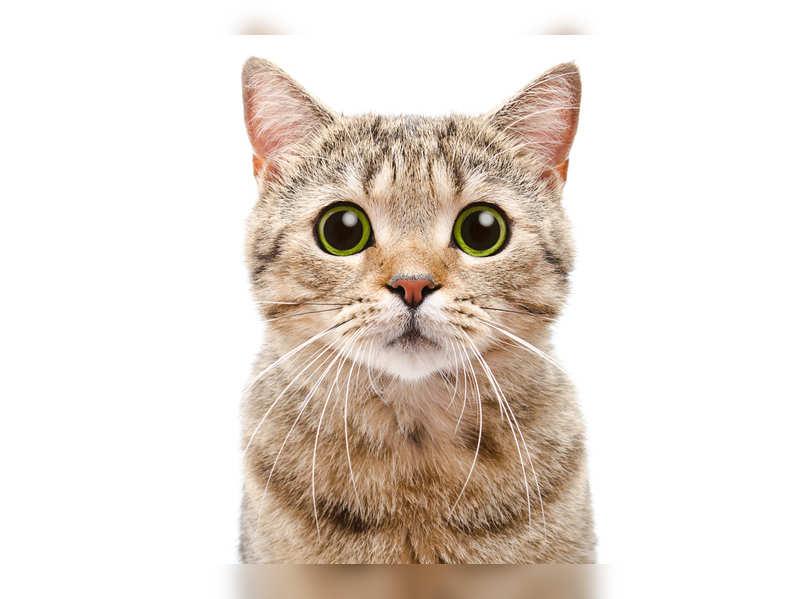

Gaussian Blurring


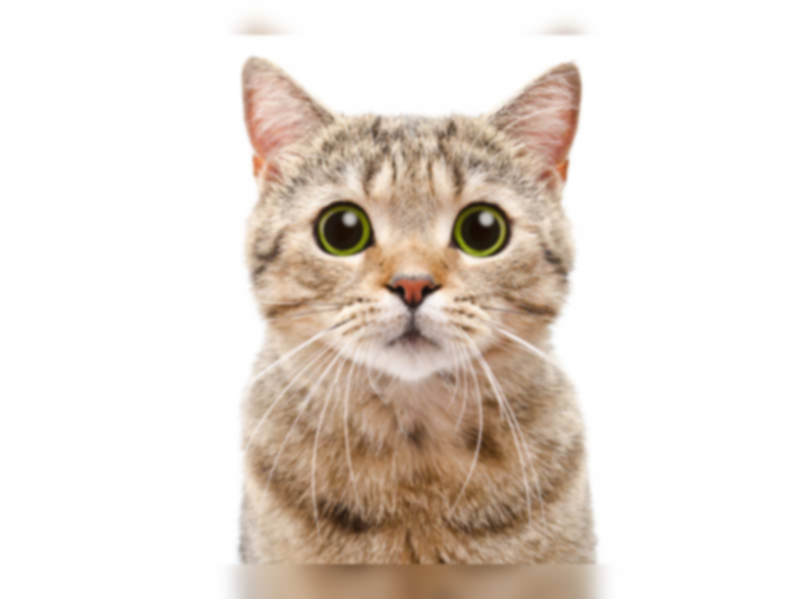

Median Blurring


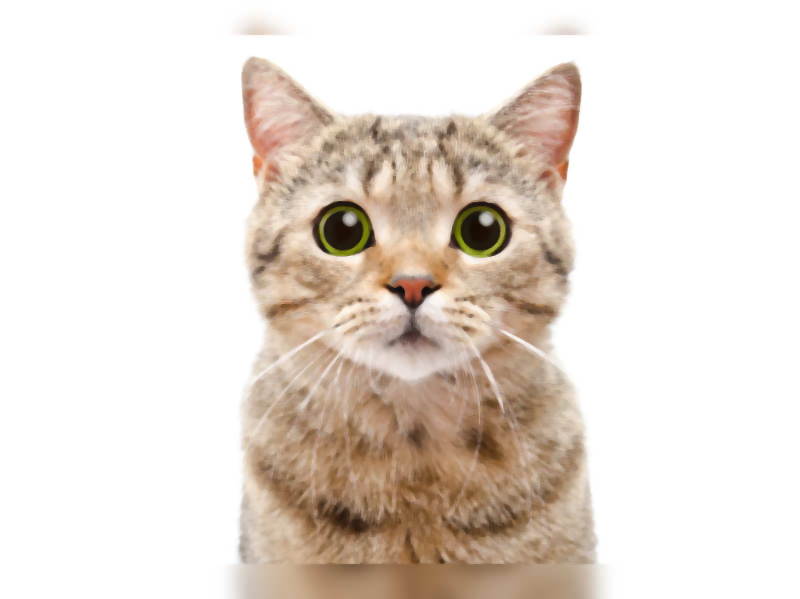

Bilateral Blurring


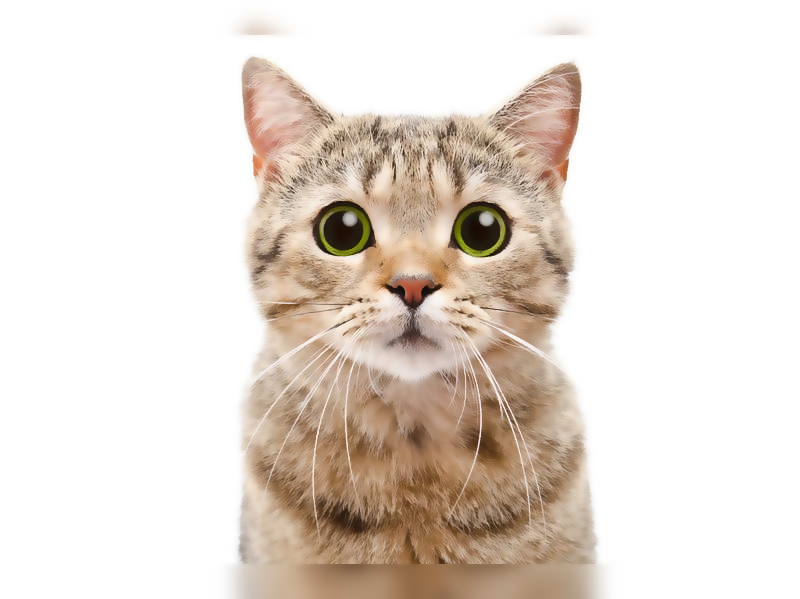

In [55]:
# importing libraries
import cv2
import numpy as np

image = cv2.imread('./images/cat3.jpeg')

print("Original Image")
cv2_imshow(image)

# Gaussian Blur
Gaussian = cv2.GaussianBlur(image, (7, 7), 0)
print('Gaussian Blurring')
cv2_imshow(Gaussian)
cv2.waitKey(0)

# Median Blur
median = cv2.medianBlur(image, 5)
print('Median Blurring')
cv2_imshow(median)
cv2.waitKey(0)


# Bilateral Blur
bilateral = cv2.bilateralFilter(image, 9, 75, 75)
print('Bilateral Blurring')
cv2_imshow(bilateral)

## Erosion and Dilation of images

**Morphological operations** are a set of operations that process images based on shapes. They apply a structuring element to an input image and generate an output image. 
The most basic morphological operations are two: **Erosion and Dilation** 

**Basics of Erosion:**

  - Erodes away the boundaries of the foreground object
  - Used to diminish the features of an image.

**Basics of dilation:**

  - Increases the object area
  - Opposite of Erosion
  - Used to accentuate features


In [66]:

# Python program to demonstrate erosion and
# dilation of images.
import cv2
import numpy as np
 
# Reading the input image
img = cv2.imread('./images/image.png', 0)
 
# Taking a matrix of size 5 as the kernel
kernel = np.ones((5, 5), np.uint8)
 
# The first parameter is the original image,
# kernel is the matrix with which image is
# convolved and third parameter is the number
# of iterations, which will determine how much
# you want to erode/dilate a given image.
# img_erosion = cv2.erode(img, kernel, iterations=1)
# img_dilation = cv2.dilate(img, kernel, iterations=1)

Again, erosions are most useful for removing small blobs from an image or disconnecting two connected components. With this in mind, take a look at the letter “p” in the PyImageSearch logo. Notice how the circular region of the “p” has disconnected from the stem after 2 erosions — this is an example of disconnecting two connected components of an image.

Eroded 1 times


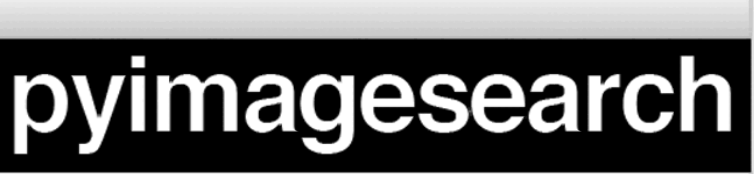

Eroded 2 times


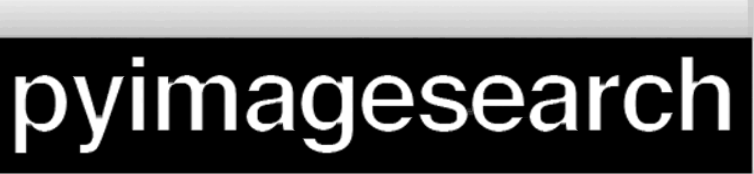

Eroded 3 times


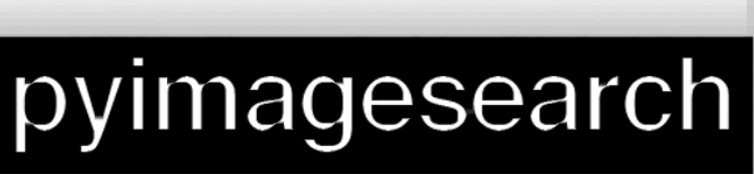

Eroded 4 times


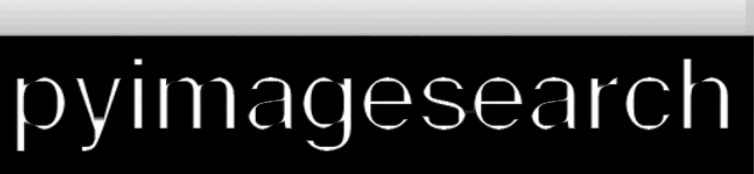

In [65]:
# apply a series of erosions
for i in range(0, 4):
  eroded = cv2.erode(img.copy(), None, iterations=i + 1)
  print("Eroded {} times".format(i + 1))
  cv2_imshow(eroded)

Dilations are especially useful when joining broken parts of an object — for example, take a look at the bottom image where we have applied a dilation with 3 iterations. By this point, the gaps between all letters in the logo have been joined.

Dilated 1 times


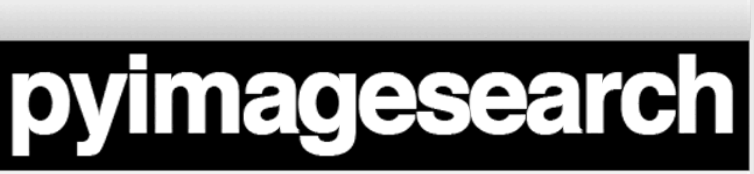

Dilated 2 times


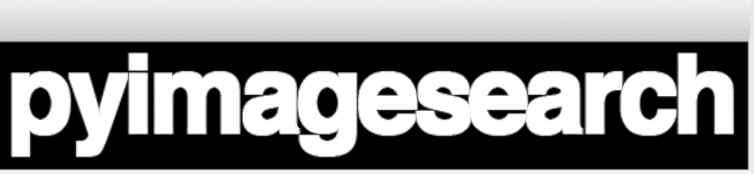

Dilated 3 times


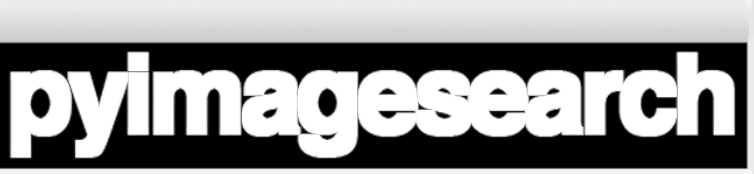

Dilated 4 times


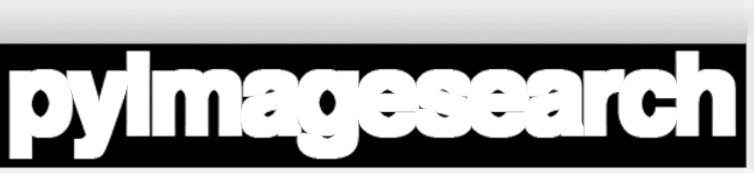

In [68]:
# apply a series of dilations
for i in range(0, 4):
  dilated = cv2.dilate(img.copy(), None, iterations=i + 1)
  print("Dilated {} times".format(i + 1))
  cv2_imshow(dilated)


**Uses of Erosion and Dilation:** 

**Erosion:** 
  - It is useful for removing small white noises.
  - Used to detach two connected objects etc.

**Dilation:**
  - In cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won’t come back, but our object area increases.
  - It is also useful in joining broken parts of an object.

## Thresholding techniques using OpenCV

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

Opencv offers three types of image thresholding techniques. They are 

1) Simple thresholding

2) Adaptive thresholding

3) Ostu's thresholding

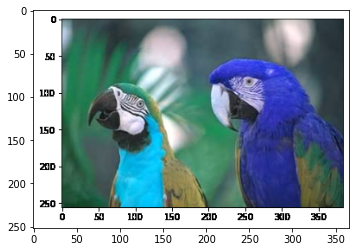

In [78]:
img=cv2.imread('./images/thresholding.png')
plt.imshow(img)
plt.show()

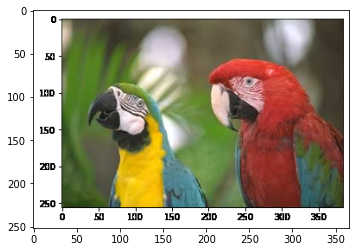

In [79]:
## Lets obtain the images with original colors
orig_img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(orig_img)
plt.show()

Simple thresholding

Syntax : **cv2.threshold(source, thresholdValue, maxVal, thresholdingTechnique)** 

The basic Thresholding technique is Binary Thresholding. For every pixel, the same threshold value is applied. If the pixel value is smaller than the threshold, it is set to 0, otherwise, it is set to a maximum value.
The different Simple Thresholding Techniques are: 

  - **cv2.THRESH_BINARY:** If pixel intensity is greater than the set threshold, value set to 255, else set to 0 (black).
  - **cv2.THRESH_BINARY_INV:** Inverted or Opposite case of cv2.THRESH_BINARY.
  - **cv.THRESH_TRUNC:** If pixel intensity value is greater than threshold, it is truncated to the threshold. The pixel values are set to be the same as the threshold. All other values remain the same.
  - **cv.THRESH_TOZERO:** Pixel intensity is set to 0, for all the pixels intensity, less than the threshold value.
  - **cv.THRESH_TOZERO_INV:** Inverted or Opposite case of cv2.THRESH_TOZERO.

#### Applying binary thresholding for the original image

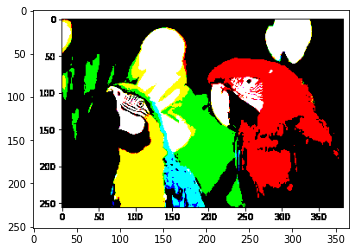

In [80]:
rect,thresh=cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
plt.imshow(thresh)
plt.show()

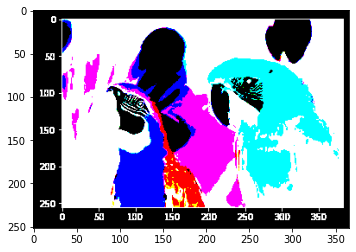

In [81]:
### Applying the vice-versa filtering technique named cv2.thresh_binary_inv
rect,thresh1=cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
plt.imshow(thresh1)
plt.show()

Applying cv2.thresh_tunc

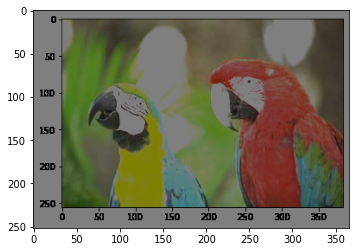

In [82]:
rect,thresh2=cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
plt.imshow(thresh2)
plt.show()

Applying cv2.THRESH_TOZERO

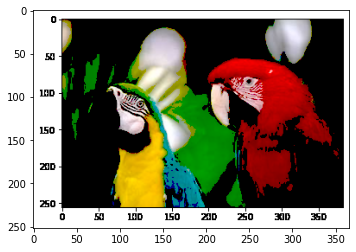

In [83]:
rect,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
plt.imshow(thresh3)
plt.show()

Applying cv2.THRESH_TOZERO_INV

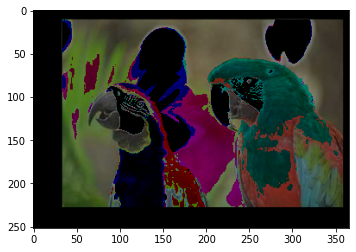

In [84]:
rect,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)
plt.imshow(thresh4)
plt.show()

Comparing cv2.THRESH_BINARY and cv2.THRESH_BINARY_INV

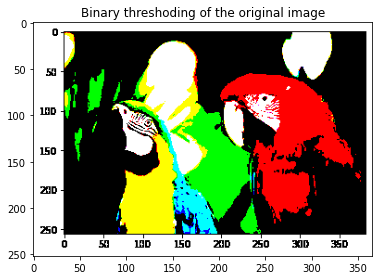

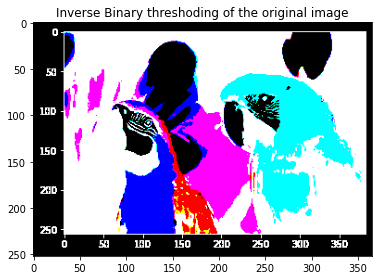

In [85]:
plt.imshow(thresh)
plt.title('Binary threshoding of the original image')
plt.tight_layout()
plt.show()

plt.imshow(thresh1)
plt.title('Inverse Binary threshoding of the original image')
plt.tight_layout()
plt.show()

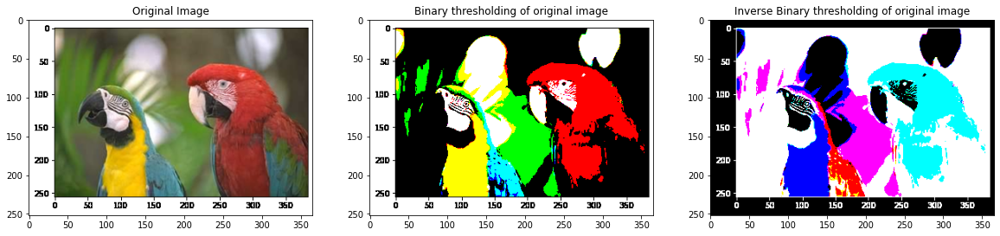

In [86]:
plt.figure(figsize=(20,5))
plt_title=['Original Image','Binary thresholding of original image','Inverse Binary thresholding of original image']
image_list=[orig_img,thresh,thresh1]

for i in range(3):
  plt.subplot(1,3,i+1)
  plt.imshow(image_list[i])
  plt.title(plt_title[i])
  #plt.tight_layout()
plt.show()

Comparing cv2.thresh_tozero and cv2.thresh_tozero_inv

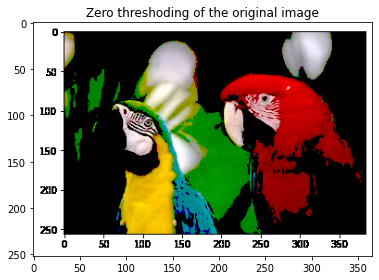

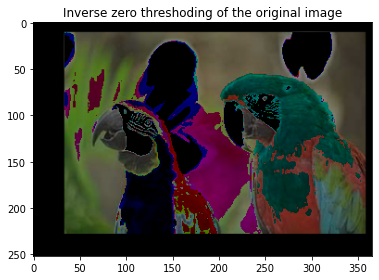

In [87]:
plt.imshow(thresh3)
plt.title('Zero threshoding of the original image')
plt.tight_layout()
plt.show()

plt.imshow(thresh4)
plt.title('Inverse zero threshoding of the original image')
plt.tight_layout()
plt.show()

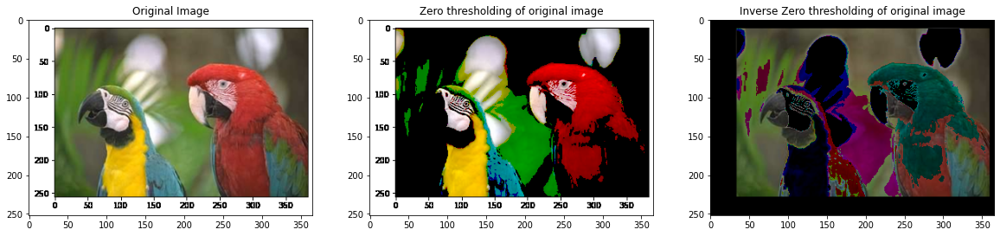

In [88]:
plt.figure(figsize=(20,5))
plt_title=['Original Image','Zero thresholding of original image','Inverse Zero thresholding of original image']
image_list=[orig_img,thresh3,thresh4]

for i in range(3):
  plt.subplot(1,3,i+1)
  plt.imshow(image_list[i])
  plt.title(plt_title[i])
  #plt.tight_layout()
plt.show()

### Adaptive thresholding

Simple Thresholding was explained with different types of thresholding techniques. Another Thresholding technique is Adaptive Thresholding. In Simple Thresholding, a global value of threshold was used which remained constant throughout. So, a constant threshold value won’t help in the case of variable lighting conditions in different areas. Adaptive thresholding is the method where the threshold value is calculated for smaller regions. This leads to different threshold values for different regions with respect to the change in lighting. We use cv2.adaptiveThreshold for this.

General Syntax of adaptive thresholding is

**cv2.adaptiveThreshold(source, maxVal, adaptiveMethod, thresholdType, blocksize, constant)**

Parameters:

  - source: Input Image array(Single-channel, 8-bit or floating-point)
  - maxVal: Maximum value that can be assigned to a pixel.
  - adaptiveMethod: Adaptive method decides how threshold value is calculated.

    - cv2.ADAPTIVE_THRESH_MEAN_C: Threshold Value = (Mean of the neighbourhood area values – constant value). In other words, it is the mean of the blockSize×blockSize neighborhood of a point minus constant.

    - cv2.ADAPTIVE_THRESH_GAUSSIAN_C: Threshold Value = (Gaussian-weighted sum of the neighbourhood values – constant value). In other words, it is a weighted sum of the blockSize×blockSize neighborhood of a point minus constant.

  - thresholdType: The type of thresholding to be applied.
  - blockSize: Size of a pixel neighborhood that is used to calculate a threshold value.
  - constant: A constant value that is subtracted from the mean or weighted sum of the neighbourhood pixels.

i) Mean Adaptive thresholding

In [89]:
img_grey = cv2.cvtColor(orig_img, cv2.COLOR_BGR2GRAY)

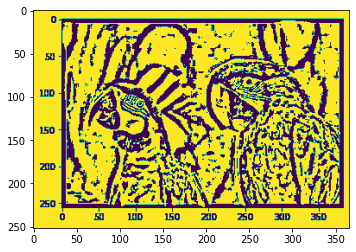

In [90]:
thresh5 = cv2.adaptiveThreshold(img_grey,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2) 
plt.imshow(thresh5)
plt.show()

ii) Gaussian thresholding

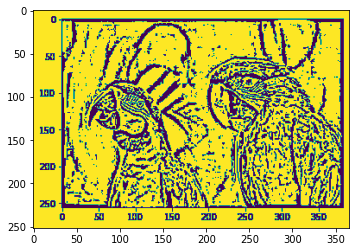

In [91]:
thresh6 = cv2.adaptiveThreshold(img_grey,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
plt.imshow(thresh6)
plt.show()

Comparison of the two guassian thresholding techniques with the original image

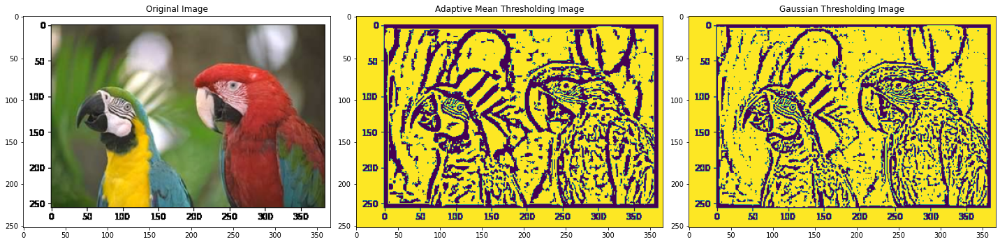

In [92]:
plt.figure(figsize=(20,5))
plt_titles=['Original Image','Adaptive Mean Thresholding Image','Gaussian Thresholding Image']
imgs=[orig_img,thresh5,thresh6]

for i in range(3):
  plt.subplot(1,3,i+1)
  plt.imshow(imgs[i])
  plt.title(plt_titles[i])
  plt.tight_layout()

plt.show()

###  Ostu's thresholding or Binarization

In Otsu Thresholding, a value of the threshold isn’t chosen but is determined automatically. A bimodal image (two distinct image values) is considered. The histogram generated contains two peaks. So, a generic condition would be to choose a threshold value that lies in the middle of both the histogram peak values.

**Syntax: cv2.threshold(source, thresholdValue, maxVal, thresholdingTechnique)**

Parameters:
  - source: Input Image array (must be in Grayscale).
  - thresholdValue: Value of Threshold below and above which pixel values will change accordingly.
  - maxVal: Maximum value that can be assigned to a pixel.
  - thresholdingTechnique: The type of thresholding to be applied.

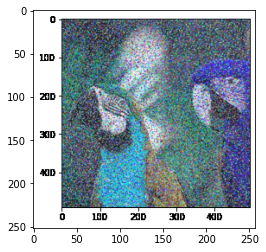

In [95]:
noise_img=cv2.imread('./images/noisy_img.png')
## Lets visualize the image

plt.imshow(noise_img)
plt.show()

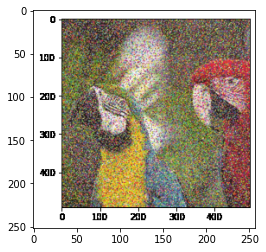

In [96]:
## Lets load the original image into the working environment

orig_nosie_img=cv2.cvtColor(noise_img, cv2.COLOR_BGR2RGB)
plt.imshow(orig_nosie_img)
plt.show()

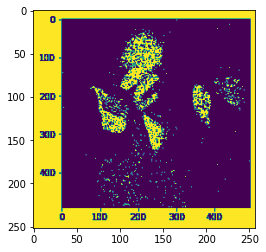

In [97]:
noise_img_grey = cv2.cvtColor(orig_nosie_img, cv2.COLOR_BGR2GRAY)

rect1,thresh7=cv2.threshold(noise_img_grey,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(thresh7)
plt.show()

Ostu's thresholding for guassian filters

As we are using the guassian filter lets blur the noisy image using the standard gaussian blur filter of cv2

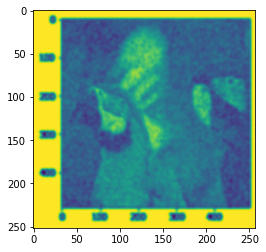

In [98]:
blur_noise_img=cv2.GaussianBlur(noise_img_grey,ksize=(7,7),sigmaX=0)
plt.imshow(blur_noise_img)
plt.show()

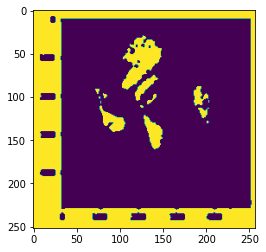

In [99]:
rect,thresh8 = cv2.threshold(blur_noise_img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(thresh8)
plt.show()

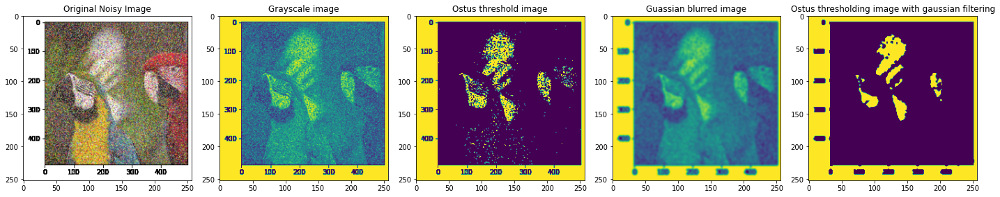

In [100]:
plt.figure(figsize=(20,5))
plt_titles=['Original Noisy Image','Grayscale image','Ostus threshold image','Guassian blurred image','Ostus thresholding image with gaussian filtering']
img_list=[orig_nosie_img,noise_img_grey,thresh7,blur_noise_img,thresh8]

for i in range(5):
  plt.subplot(1,5,i+1)
  plt.imshow(img_list[i])
  plt.title(plt_titles[i])
  plt.tight_layout()

plt.show()

## Filter Color

Colour segmentation or color filtering is widely used in OpenCV for identifying specific objects/regions having a specific color. The most widely used color space is RGB color space, it is called an additive color space as the three color shades add up to give color to the image. To identify a region of a specific color, put the threshold and create a mask to separate the different colors. HSV color space is much more useful for this purpose as the colors in HSV space are much more localized thus can be easily separated. Color Filtering has many applications and uses cases such as in Cryptography, infrared analysis, food preservation of perishable foods, etc. In such cases, the concepts of Image processing can be used to find out or extract out regions of a particular color. 
For color segmentation, all we need is the threshold values or the knowledge of the lower bound and upper bound range of colors in one of the color spaces. It works best in the Hue-Saturation-Value color space. 
After specifying the range of color to be segmented, it is needed to create a mask accordingly and by using it, a particular region of interest can be separated out.

In [12]:
### The code to filter green colour from the image is:

#import the libraries
import cv2 as cv
import numpy as np

#read the image
img = cv.imread("./images/filter.jpeg")
print(img.shape)

#convert the BGR image to HSV colour space
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

#set the lower and upper bounds for the green hue
lower_green = np.array([50,100,50])
upper_green = np.array([70,255,255])

#create a mask for green colour using inRange function
mask = cv.inRange(hsv, lower_green, upper_green)

#perform bitwise and on the original image arrays using the mask
res = cv.bitwise_and(img, img, mask=mask)

#display the images
cv2_imshow(img)
print("orignal image")
cv2_imshow(mask)
print("mask")
cv2_imshow(hsv)
print("hsv")
cv2_imshow(res)
print("res")

Output hidden; open in https://colab.research.google.com to view.

### Creating Colour Pop Effects using the concept of Colour Filtering:

The process flow to create a red colour pop filter is as follows:

  1. Read the image and convert it to the HSV format.
  2. Set the lower and upper bounds for the HSV of the red colour you are going to filter. One way to find the HSV colour space values of a colour is to run the following code snippet.

In [15]:
img = cv.imread("./images/pop_img.jpeg")
cv2_imshow(img)
img.shape

Output hidden; open in https://colab.research.google.com to view.

In [14]:
img = np.uint8([[[0,0,255]]])
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
print(hsv)

[[[  0 255 255]]]


OpenCV reads images in BGR format, and that’s why red colour is [0, 0, 255]. The above code snippet prints:
`[[[  0 255 255]]]`

which is the HSV value of red colour(hue- 0, saturation- 255(100%), value- 255(100%). You can also do the same for a specific pixel in an image, to find the HSV value of that pixel.


In [18]:
pixel = img[2000, 1000]
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
print(hsv)

[[[  6  41  31]
  [  6  40  32]
  [  6  39  33]
  ...
  [110  16  49]
  [110  15  50]
  [110  14  54]]

 [[  6  40  32]
  [  6  40  32]
  [  6  39  33]
  ...
  [110  15  50]
  [110  15  50]
  [110  15  51]]

 [[  6  39  33]
  [  6  39  33]
  [  6  38  34]
  ...
  [110  15  51]
  [110  15  50]
  [110  15  50]]

 ...

 [[165  16  31]
  [165  15  33]
  [165  15  34]
  ...
  [  0   0  35]
  [  0   0  33]
  [  0   0  33]]

 [[165  15  33]
  [165  15  34]
  [165  15  35]
  ...
  [  0   0  34]
  [  0   0  32]
  [  0   0  32]]

 [[165  15  34]
  [165  14  36]
  [165  14  36]
  ...
  [  0   0  33]
  [  0   0  31]
  [  0   0  31]]]


3. Create a mask for red hue using inRange function of OpenCV.
4. Create an inverse of the mask using the bitwise_not operation on the mask.
5. Filter only the red coloured portion of the original image using the mask(foreground).
6. Obtain the grayscale format of the original image using cv.cvtColor function.
7. Now use the inverse of the mask to filter only the regions containing colours other than red in the original image, from the grayscale image(background).
8. Before adding the background to the foreground, you have to convert the grayscale background image which has only one channel to a three channel grayscale image using numpy.stack() function. This step should be done because OpenCV’s add function works only if both the images to be added are of the same shape.
9. Add the foreground and the background to get the final image with only the red color popping out from a grayscale background.

In [21]:
### The code to create the red colour pop filter is:

#import the libraries
import cv2 as cv
import numpy as np

#read the image
img = cv.imread("./images/pop_img.jpeg")

#convert the BGR image to HSV colour space
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

#6. obtain the grayscale image of the original image
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#set the bounds for the red hue
lower_red = np.array([160,100,50])
upper_red = np.array([180,255,255])

#3. create a mask using the bounds set
mask = cv.inRange(hsv, lower_red, upper_red)

#4. create an inverse of the mask
mask_inv = cv.bitwise_not(mask)

#5. Filter only the red colour from the original image using the mask(foreground)
res = cv.bitwise_and(img, img, mask=mask)

#7. Filter the regions containing colours other than red from the grayscale image(background)
background = cv.bitwise_and(gray, gray, mask = mask_inv)

#8. convert the one channelled grayscale background to a three channelled image
background = np.stack((background,)*3, axis=-1)

#9. add the foreground and the background
added_img = cv.add(res, background)

#display the images
cv2_imshow(img)
print("Original Image")

cv2_imshow(background)
print("Background")

cv2_imshow(mask_inv)
print("Mask Inverted")

cv2_imshow(added_img)
print("Image Added")

cv2_imshow(mask)
print("mask")

cv2_imshow(gray)
print("gray")

cv2_imshow(hsv)
print("hsv")


Output hidden; open in https://colab.research.google.com to view.

## Smoothing and Blurring

**Smoothing** and **Blurring** is one of the most common preprocessing steps in computer vision and image. While this effect is usually unwanted in our photographs, it’s actually quite helpful when performing image processing tasks.

By smoothing an image prior to applying techniques such as edge detection or thresholding we are able to reduce the amount of high-frequency content, such as noise and edges (i.e., the “detail” of an image).

While this may sound counter-intuitive, by reducing the detail in an image we can more easily find objects that we are interested in.

Furthermore, this allows us to focus on the larger structural objects in the image.

Following are some of the smoothing and blurring techniques :-

  - Simple average blurring
  - Gaussian blurring
  - Median filtering
  - Bilateral filtering

### Average blurring ( cv2.blur )

An average filter does exactly what you think it might do — takes an area of pixels surrounding a central pixel, averages all these pixels together, and replaces the central pixel with the average.

By taking the average of the region surrounding a pixel, we are smoothing it and replacing it with the value of its local neighborhood. This allows us to reduce noise and the level of detail, simply by relying on the average.

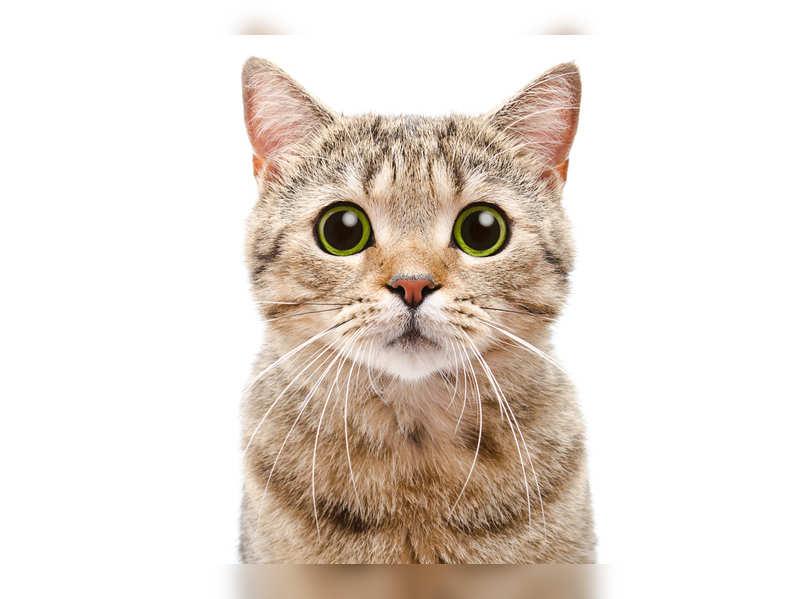

In [7]:
img = cv2.imread('./images/cat3.jpeg')
cv2_imshow(img)

Average (3, 3)


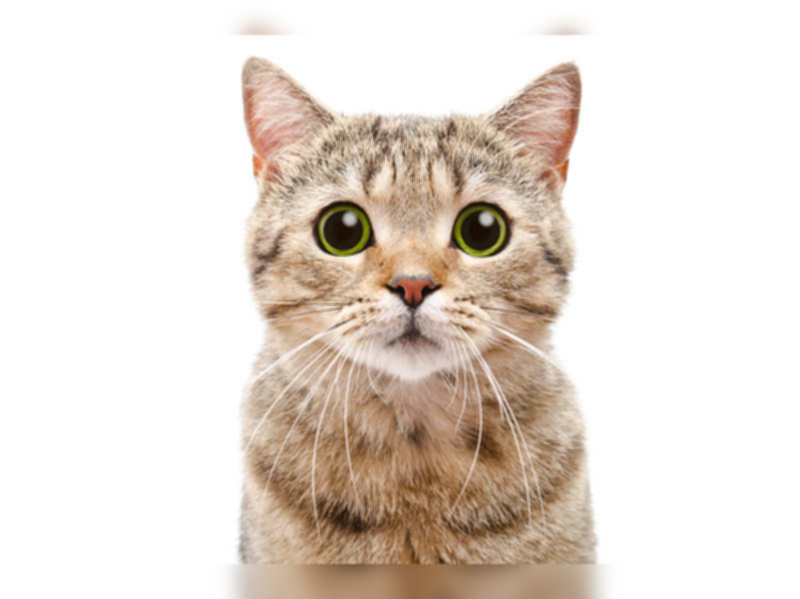

Average (9, 9)


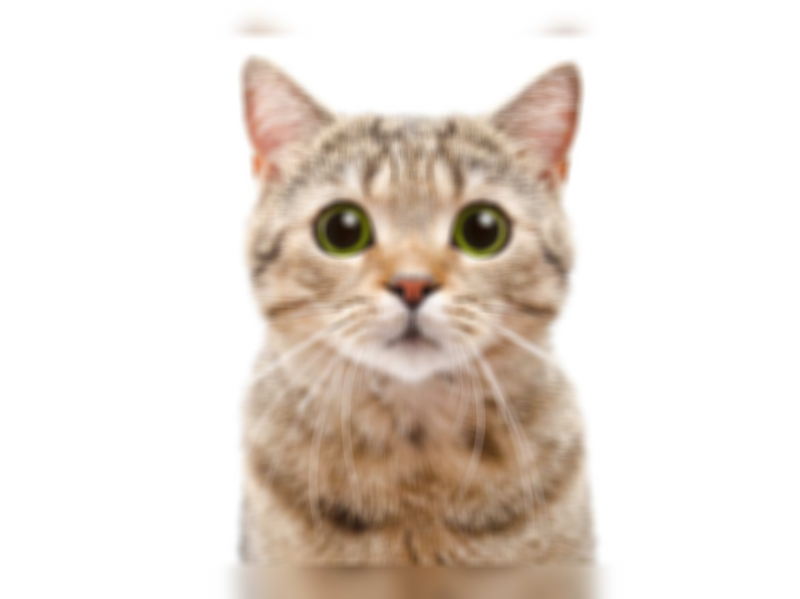

Average (15, 15)


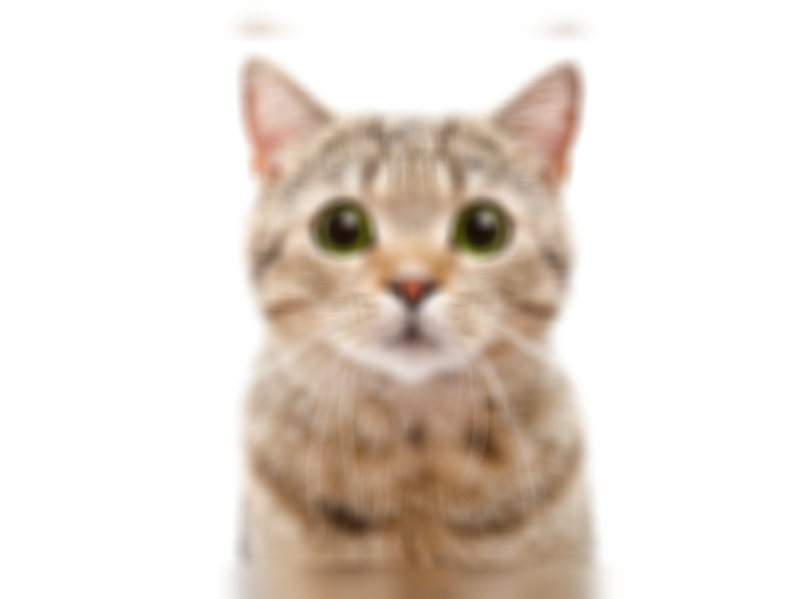

In [9]:
kernelSizes = [(3, 3), (9, 9), (15, 15)]
# loop over the kernel sizes
for (kX, kY) in kernelSizes:
	# apply an "average" blur to the image using the current kernel
	# size
 blurred = cv2.blur(img, (kX, kY))
 print("Average ({}, {})".format(kX, kY))
 cv2_imshow(blurred)

While average smoothing was quite simple to understand, it also weights each pixel inside the kernel area equally — and by doing this it becomes easy to over-blur our image and miss out on important edges. We can remedy this problem by applying Gaussian blurring.

### Gaussian blurring ( cv2.GaussianBlur)

Gaussian blurring is similar to average blurring, but instead of using a simple mean, we are now using a weighted mean, where neighborhood pixels that are closer to the central pixel contribute more “weight” to the average.

The end result is that our image is less blurred, but more “naturally blurred,” than using the average method discussed in the previous section. Furthermore, based on this weighting we’ll be able to preserve more of the edges in our image as compared to average smoothing.

Gaussian (3, 3)


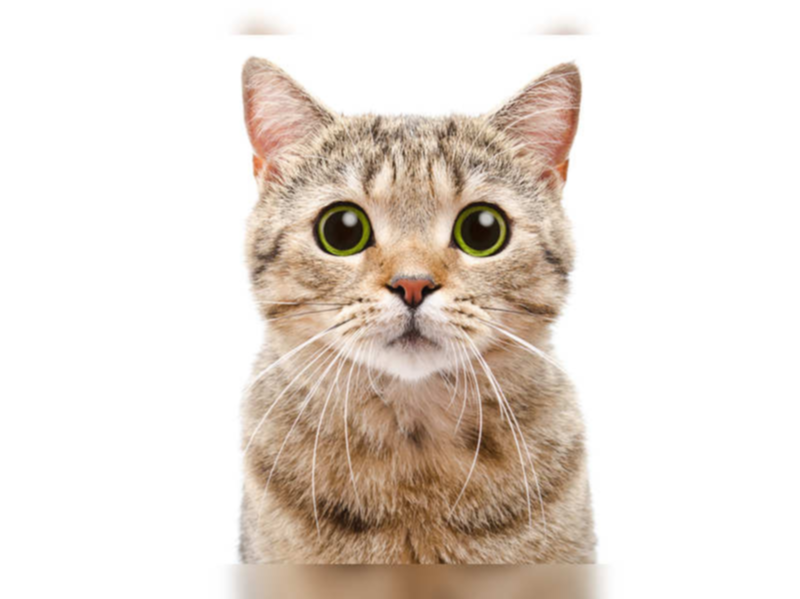

Gaussian (9, 9)


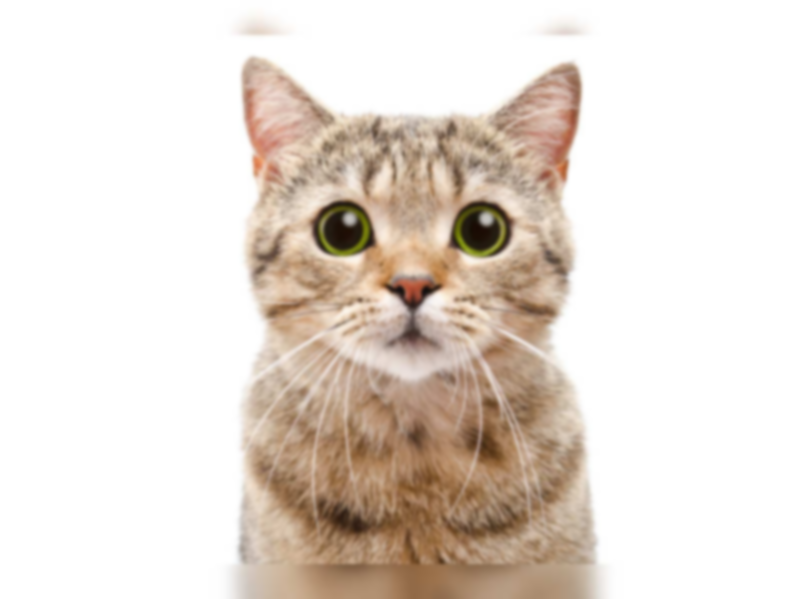

Gaussian (15, 15)


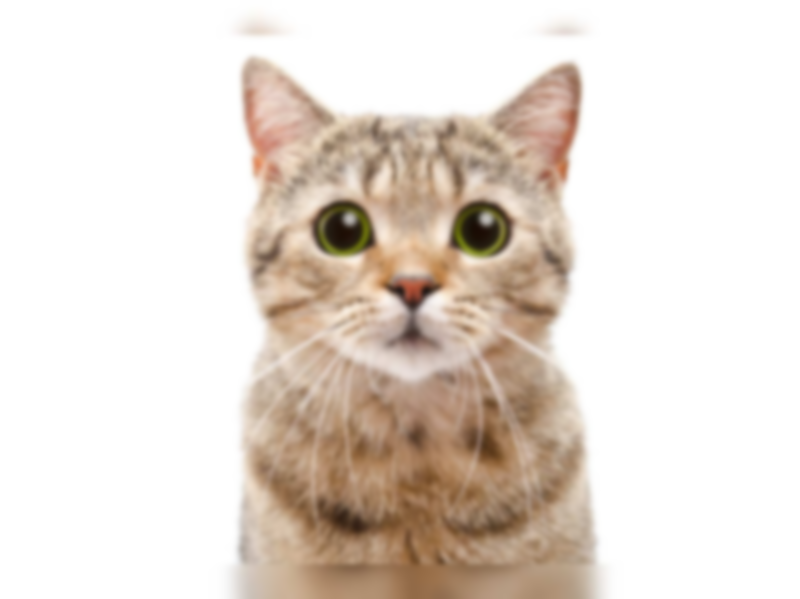

In [11]:
# loop over the kernel sizes again
for (kX, kY) in kernelSizes:
	# apply a "Gaussian" blur to the image
 blurred = cv2.GaussianBlur(img, (kX, kY), 0)
 print("Gaussian ({}, {})".format(kX, kY))
 cv2_imshow(blurred)


In general, start with a simple Gaussian blur and tune your parameters as needed. While the Gaussian blur is slightly slower than a simple average blur (and only by a tiny fraction), a Gaussian blur tends to give much nicer results, especially when applied to natural images.

### Median blurring ( cv2.medianBlur )

Traditionally, the median blur method has been most effective when removing salt-and-pepper noise. This type of noise is exactly what it sounds like: imagine taking a photograph, putting it on your dining room table, and sprinkling salt and pepper on top of it. Using the median blur method, you could remove the salt and pepper from your image.

Notice how, unlike average blurring and Gaussian blurring where the kernel size could be rectangular, the kernel size for the median must be square. Furthermore (unlike the averaging method), instead of replacing the central pixel with the average of the neighborhood, we instead replace the central pixel with the median of the neighborhood.

Median 3


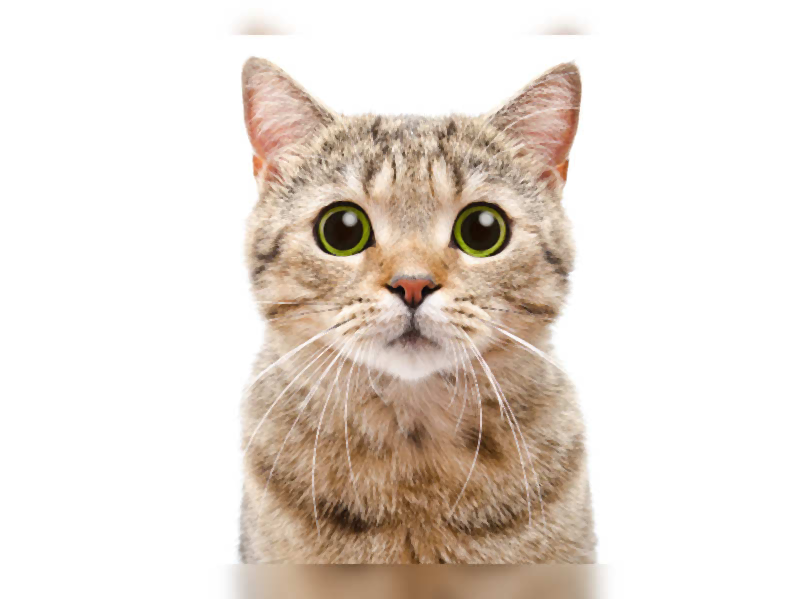

Median 9


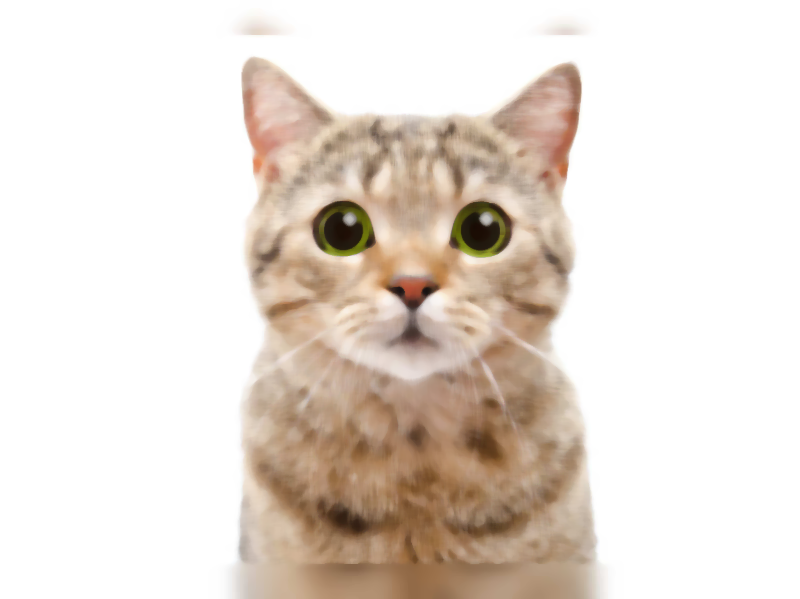

Median 15


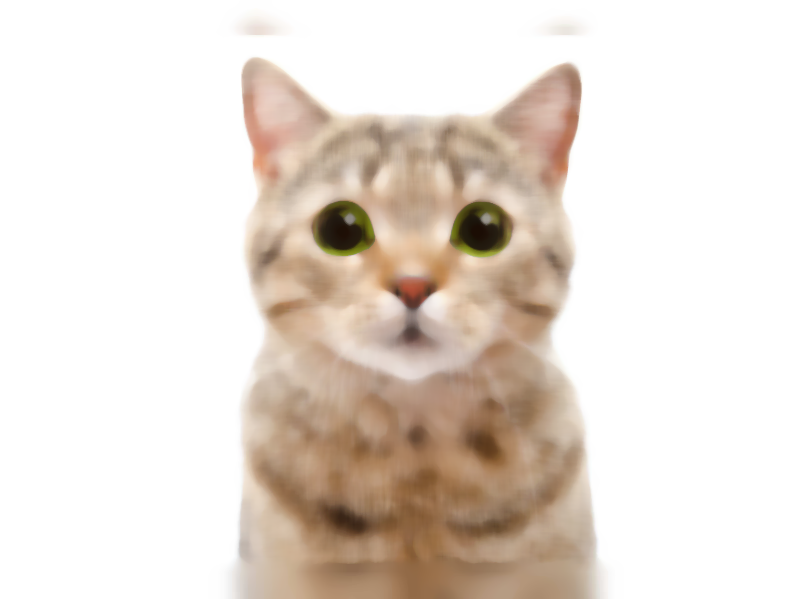

In [13]:
# loop over the kernel sizes a final time
for k in (3, 9, 15):
	# apply a "median" blur to the image
 blurred = cv2.medianBlur(img, k)
 print("Median {}".format(k))
 cv2_imshow(blurred)

The median blur is by no means a “natural blur” like Gaussian smoothing. However, for damaged images or photos captured under highly suboptimal conditions, a median blur can really help as a pre-processing step prior to passing the image along to other methods, such as thresholding and edge detection.

### Bilateral blurring ( cv2.bilateralFilter )

To reduce noise while still maintaining edges, we can use bilateral blurring. Bilateral blurring accomplishes this by introducing two Gaussian distributions.

The first Gaussian function only considers spatial neighbors. That is, pixels that appear close together in the (x, y)-coordinate space of the image. The second Gaussian then models the pixel intensity of the neighborhood, ensuring that only pixels with similar intensity are included in the actual computation of the blur.

Intuitively, this makes sense. If pixels in the same (small) neighborhood have a similar pixel value, then they likely represent the same object. But if two pixels in the same neighborhood have contrasting values, then we could be examining the edge or boundary of an object — and we would like to preserve this edge.

Overall, this method is able to preserve edges of an image, while still reducing noise. The largest downside to this method is that it is considerably slower than its averaging, Gaussian, and median blurring counterparts.

Blurred d=11, sc=21, ss=7


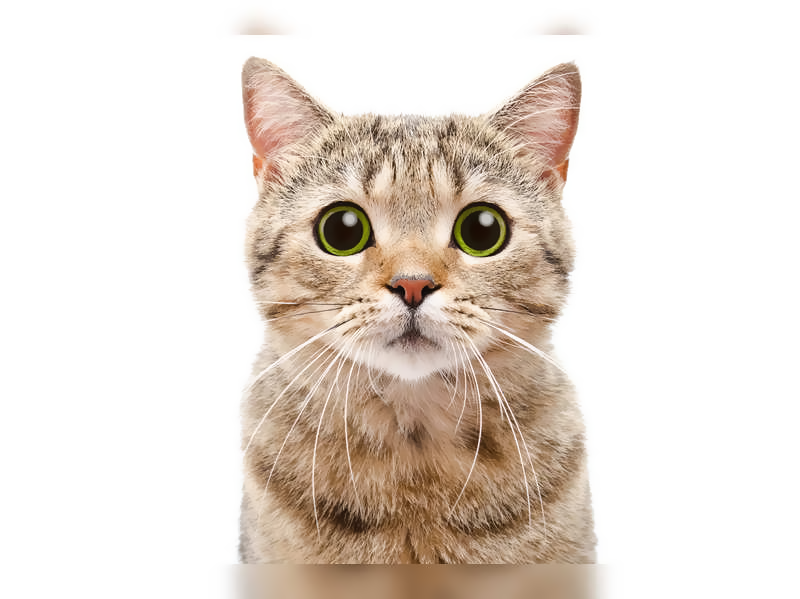

Blurred d=11, sc=41, ss=21


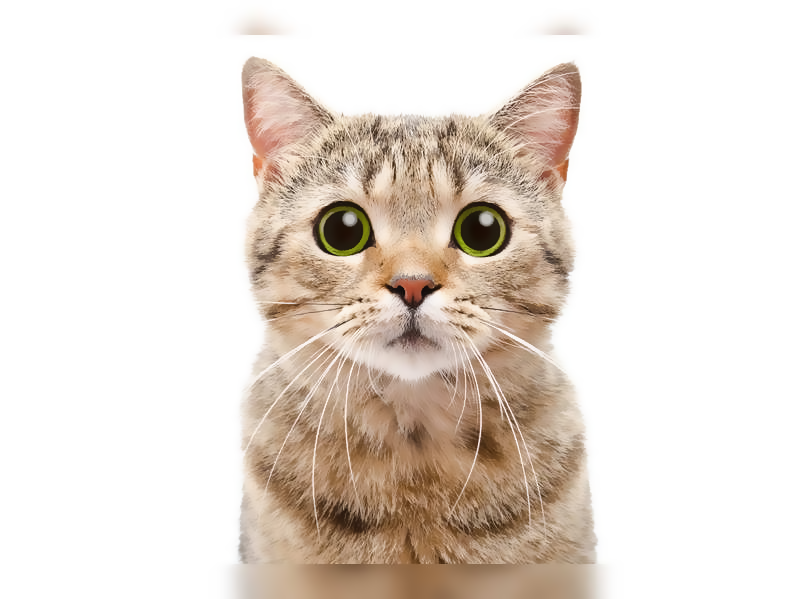

Blurred d=11, sc=61, ss=39


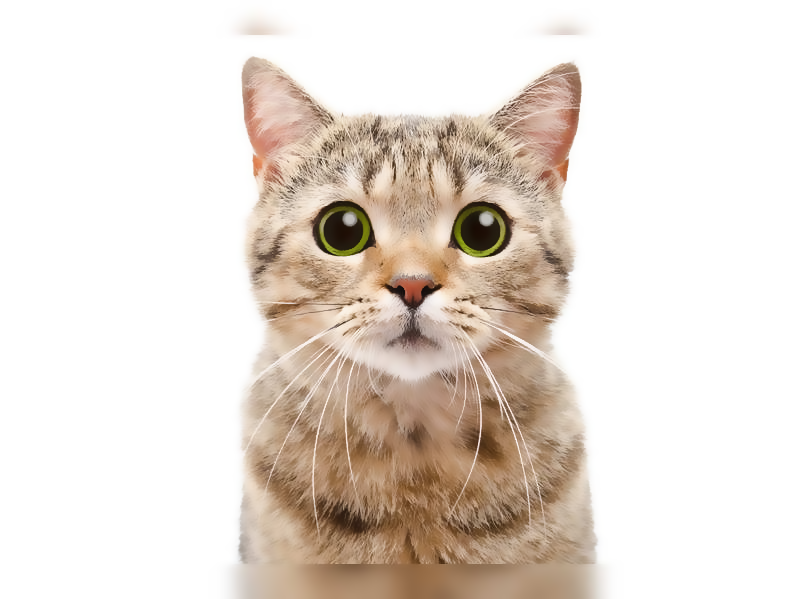

In [15]:
params = [(11, 21, 7), (11, 41, 21), (11, 61, 39)]
# loop over the diameter, sigma color, and sigma space
for (diameter, sigmaColor, sigmaSpace) in params:
	# apply bilateral filtering to the image using the current set of
	# parameters
  blurred = cv2.bilateralFilter(img, diameter, sigmaColor, sigmaSpace)
	# show the output image and associated parameters
  title = "Blurred d={}, sc={}, ss={}".format(
		diameter, sigmaColor, sigmaSpace)
  print(title)
  cv2_imshow(blurred)
 

. The first parameter we supply is the image we want to blur. Then, we need to define the diameter of our pixel neighborhood — the larger this diameter is, the more pixels will be included in the blurring computation. Think of this parameter as a square kernel size.

The third argument is our color standard deviation, denoted as \sigma_{color}. A larger value for \sigma_{color} means that more colors in the neighborhood will be considered when computing the blur. If we let \sigma_{color} get too large in respect to the diameter, then we essentially have broken the assumption of bilateral filtering — that only pixels of similar color should contribute significantly to the blur.

Finally, we need to supply the space standard deviation, which we call \sigma_{space}. A larger value of \sigma_{space} means that pixels farther out from the central pixel diameter will influence the blurring calculation.

The simple average method is fast, but may not preserve edges in images.

Applying a Gaussian blur is better at preserving edges, but is slightly slower than the average method.

A median filter is primarily used to reduce salt-and-pepper style noise as the median statistic is much more robust and less sensitive to outliers than other statistical methods such as the mean.

Finally, the bilateral filter preserves edges, but is significantly slower than the other methods. Bilateral filtering also boasts the most parameters to tune which can become a nuisance to tune correctly.

In general, start with a simple Gaussian blur to obtain a baseline and then going from there.

## Background subtraction

`Definition` - Background subtraction is a widely used approach to detect moving objects in a sequence of frames from static cameras. The base in this approach is that of detecting moving objects from the difference between the current frame and reference frame, which is often called ‘Background Image’ or ‘Background Model’. This background subtraction is typically done by detecting the foreground objects in a video frame and foreground detection is the main task of this whole approach.  


**Background Subtraction** has several use cases in everyday life, It is being used for object segmentation, security enhancement, pedestrian tracking, counting the number of visitors, number of vehicles in traffic etc. It is able to learn and identify the foreground mask.
As the name suggests, it is able to subtract or eliminate the background portion in an image. Its output is a binary segmented image which essentially gives information about the non-stationary objects in the image. There lies a problem in this concept of finding non-stationary portion, as the shadow of the moving object can be moving and sometimes being classified in the foreground.

The popular Background subtraction algorithms are:- 

  - **BackgroundSubtractorMOG** : It is a gaussian mixture based background segmentation algorithm.
  - **BackgroundSubtractorMOG2**: It uses the same concept but the major advantage that it provides is in terms of stability even when there is change in luminosity and better identification capability of shadows in the frames.
  - **Geometric multigrid**: It makes uses of statistical method and per pixel bayesin segmentation algorithm.

See the code files separetly attached.


## Play a video using OpenCV

To capture a video, we need to create a VideoCapture object. VideoCapture have the device index or the name of a video file. Device index is just the number to specify which camera. If we pass 0 then it is for first camera, 1 for second camera so on. We capture the video frame by frame.

Syntax

  - cv2.VideoCapture(0): Means first camera or webcam.
  - cv2.VideoCapture(1):  Means second camera or webcam.
  - cv2.VideoCapture(“file name.mp4”): Means video file

In [6]:
# importing libraries
import cv2
import numpy as np

# Create a VideoCapture object and read from input file
cap = cv2.VideoCapture('./images/test.mp4')

# Check if camera opened successfully
if (cap.isOpened()== False):
	print("Error opening video file")

# Read until video is completed
while(cap.isOpened()):
	
# Capture frame-by-frame
	ret, frame = cap.read()
	if ret == True:
	# Display the resulting frame
		cv2_imshow(frame)
		
	# Press Q on keyboard to exit
		if cv2.waitKey(25) & 0xFF == ord('q'):
			break

# Break the loop
	else:
		break

# When everything done, release
# the video capture object
cap.release()

# Closes all the frames
cv2.destroyAllWindows()


Output hidden; open in https://colab.research.google.com to view.